## Understanding the data

Thanks to the documentation I understood what my dataset is and that my core values are:

PRCP = Precipitation (mm or inches as per user preference)

SNOW = Snowfall (mm or inches as per user preference)

SNWD = Snow depth (mm or inches as per user preference)

TMAX = Maximum temperature (Fahrenheit or Celsius as per user preference)

TMIN = Minimum temperature (Fahrenheit or Celsius as per user preference)

## Load the data

In [1]:
!pip install tensorflow


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: C:\Users\pauli\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [2]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, LSTM, Dense
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

In [3]:
#Load the data
weather = pd.read_csv('weather.csv', index_col= 'DATE')

In [4]:
#Check loaded data
weather

,STATION,NAME,AWND,FMTM,PGTM,PRCP,PSUN,SNOW,SNWD,TAVG,...,WT14,WT15,WT16,WT17,WT18,WT19,WT21,WT22,WV03,WV20
DATE,,,,,,,,,,,,,,,,,,,,,
1963-09-05,USW00004781,"ISLIP LI MACARTHUR AIRPORT, NY US",NaN,NaN,NaN,0.00,NaN,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1963-09-06,USW00004781,"ISLIP LI MACARTHUR AIRPORT, NY US",NaN,NaN,NaN,0.22,NaN,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1963-09-07,USW00004781,"ISLIP LI MACARTHUR AIRPORT, NY US",NaN,NaN,NaN,0.00,NaN,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1963-09-08,USW00004781,"ISLIP LI MACARTHUR AIRPORT, NY US",NaN,NaN,NaN,0.00,NaN,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1963-09-09,USW00004781,"ISLIP LI MACARTHUR AIRPORT, NY US",NaN,NaN,NaN,0.00,NaN,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-12,USW00004781,"ISLIP LI MACARTHUR AIRPORT, NY US",16.55,NaN,1039.0,0.00,NaN,0.0,0.0,41.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-12-13,USW00004781,"ISLIP LI MACARTHUR AIRPORT, NY US",8.28,NaN,905.0,0.00,NaN,0.0,0.0,30.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-12-14,USW00004781,"ISLIP LI MACARTHUR AIRPORT, NY US",4.25,NaN,1030.0,0.00,NaN,0.0,0.0,28.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Prepare data

In [5]:
#Choose only core values from dataset
core_val_weather = weather[['PRCP', 'SNOW', 'SNWD', 'TMAX', 'TMIN']].copy()

In [6]:
#Check nwe dataset
core_val_weather

,PRCP,SNOW,SNWD,TMAX,TMIN
DATE,,,,,
1963-09-05,0.00,0.0,0.0,64,53
1963-09-06,0.22,0.0,0.0,59,54
1963-09-07,0.00,0.0,0.0,73,50
1963-09-08,0.00,0.0,0.0,77,52
1963-09-09,0.00,0.0,0.0,75,52
...,...,...,...,...,...
2024-12-12,0.00,0.0,0.0,43,28
2024-12-13,0.00,0.0,0.0,34,22
2024-12-14,0.00,0.0,0.0,35,20


In [7]:
#Change columns names
core_val_weather.columns = ['percip', 'snow', 'snow_dep', 'temp_max', 'temp_min']

In [8]:
#Check the renamed dataset
core_val_weather

,percip,snow,snow_dep,temp_max,temp_min
DATE,,,,,
1963-09-05,0.00,0.0,0.0,64,53
1963-09-06,0.22,0.0,0.0,59,54
1963-09-07,0.00,0.0,0.0,73,50
1963-09-08,0.00,0.0,0.0,77,52
1963-09-09,0.00,0.0,0.0,75,52
...,...,...,...,...,...
2024-12-12,0.00,0.0,0.0,43,28
2024-12-13,0.00,0.0,0.0,34,22
2024-12-14,0.00,0.0,0.0,35,20


In [9]:
#Check fo NANs in new dataset
core_val_weather.isnull().sum()

percip        5
snow          5
snow_dep    135
temp_max      0
temp_min      0
dtype: int64

In [10]:
#Check wheter the columns are necessary for another analysis
core_val_weather['percip'].value_counts()

percip
0.00    15259
0.01      545
0.02      452
0.03      330
0.05      271
        ...  
4.47        1
1.77        1
4.65        1
3.04        1
2.80        1
Name: count, Length: 293, dtype: int64

In [11]:
core_val_weather['snow'].value_counts()

snow
0.0     21643
1.0        77
0.1        60
2.0        57
0.2        45
        ...  
9.8         1
14.9        1
10.3        1
6.6         1
23.5        1
Name: count, Length: 95, dtype: int64

In [12]:
core_val_weather['snow_dep'].value_counts()

snow_dep
0.0     20941
1.0       267
2.0       257
3.0       159
4.0        92
6.0        60
5.0        58
7.0        46
1.2        43
8.0        35
11.0       30
3.1        23
5.1        22
9.1        18
9.0        17
9.8        15
14.0       15
10.0       14
12.0       14
7.9        14
13.0       13
3.9        12
5.9        11
15.0       10
7.1         7
18.0        6
11.8        6
22.0        4
16.0        4
14.2        3
16.9        3
17.0        3
16.1        3
26.0        2
25.0        2
18.1        2
19.0        2
24.0        2
20.0        1
23.0        1
21.0        1
20.9        1
18.9        1
22.8        1
20.1        1
Name: count, dtype: int64

In [13]:
#Check columns with percipitation for analyse whe there NAN values
core_val_weather[pd.isnull(core_val_weather['percip'])]

,percip,snow,snow_dep,temp_max,temp_min
DATE,,,,,
1965-03-17,NaN,0.5,0.0,44,28
1965-03-18,NaN,0.0,0.0,40,34
1994-02-23,NaN,4.0,0.0,34,28
1997-02-14,NaN,NaN,NaN,49,28
1998-02-05,NaN,0.0,0.0,35,33


In [14]:
#see what happend before 1965-03-17 and after that
core_val_weather.loc['1965-03-10':'1965-03-25']

,percip,snow,snow_dep,temp_max,temp_min
DATE,,,,,
1965-03-10,0.00,0.0,0.0,45,34
1965-03-11,0.00,0.0,0.0,38,27
1965-03-12,0.00,0.0,0.0,41,22
1965-03-13,0.00,0.0,0.0,44,23
1965-03-14,0.00,0.0,0.0,45,21
1965-03-15,0.01,0.0,0.0,43,33
1965-03-16,0.00,0.0,0.0,47,32
1965-03-17,NaN,0.5,0.0,44,28
1965-03-18,NaN,0.0,0.0,40,34


In [15]:
#Check columns with snow for analyse whe there NAN values
core_val_weather[pd.isnull(core_val_weather['snow'])]

,percip,snow,snow_dep,temp_max,temp_min
DATE,,,,,
1963-12-12,0.23,NaN,NaN,38,25
1997-02-14,NaN,NaN,NaN,49,28
2001-01-25,0.00,NaN,3.0,38,24
2001-10-31,0.00,NaN,NaN,58,36
2006-06-26,0.13,NaN,NaN,74,68


In [16]:
#see what happend before 1963-12-12 and after that
core_val_weather.loc['1963-12-01':'1963-12-17']

,percip,snow,snow_dep,temp_max,temp_min
DATE,,,,,
1963-12-01,0.00,0.0,0.0,37,26
1963-12-02,0.26,0.0,0.0,42,22
1963-12-03,0.13,0.0,0.0,40,33
1963-12-04,0.00,0.0,0.0,39,27
1963-12-05,0.00,0.0,0.0,45,22
1963-12-06,0.00,0.0,0.0,43,38
1963-12-07,0.00,0.0,0.0,47,30
1963-12-08,0.08,0.0,0.0,54,26
1963-12-09,0.46,0.0,0.0,55,31


In [17]:
#Check columns with snow depth for analyse whe there NAN values
core_val_weather[pd.isnull(core_val_weather['snow_dep'])]

,percip,snow,snow_dep,temp_max,temp_min
DATE,,,,,
1963-12-12,0.23,NaN,NaN,38,25
1964-01-13,0.76,8.0,NaN,25,14
1965-03-21,0.00,0.0,NaN,33,18
1969-12-18,0.00,0.0,NaN,36,17
1969-12-24,0.01,0.0,NaN,27,19
...,...,...,...,...,...
2003-12-20,0.00,0.0,NaN,39,26
2003-12-21,0.00,0.0,NaN,38,21
2006-06-26,0.13,NaN,NaN,74,68


In [18]:
#see what happend before 1963-12-12and after that
core_val_weather.loc['1963-12-01':'1963-12-17']

,percip,snow,snow_dep,temp_max,temp_min
DATE,,,,,
1963-12-01,0.00,0.0,0.0,37,26
1963-12-02,0.26,0.0,0.0,42,22
1963-12-03,0.13,0.0,0.0,40,33
1963-12-04,0.00,0.0,0.0,39,27
1963-12-05,0.00,0.0,0.0,45,22
1963-12-06,0.00,0.0,0.0,43,38
1963-12-07,0.00,0.0,0.0,47,30
1963-12-08,0.08,0.0,0.0,54,26
1963-12-09,0.46,0.0,0.0,55,31


Through my analysis, I observed that in each column, both before and after the missing values, there was no precipitation or only a small amount of it, no snowfall, and a snow depth of 0. Based on this pattern, I assume that on days with missing values, none of these weather phenomena occurred. Therefore, I decided filling all missing values with 0.

In [19]:
core_val_weather = core_val_weather.fillna(0)

In [20]:
#Check if there are any missing values
core_val_weather.isnull().sum()

percip      0
snow        0
snow_dep    0
temp_max    0
temp_min    0
dtype: int64

In Machine Learning algorithms is important, that values I use to make predictions are numerical, so now I check if I have correct types

In [21]:
# Veryfing data types
core_val_weather.dtypes

percip      float64
snow        float64
snow_dep    float64
temp_max      int64
temp_min      int64
dtype: object

In [22]:
#Check index type
core_val_weather.index

Index(['1963-09-05', '1963-09-06', '1963-09-07', '1963-09-08', '1963-09-09',
       '1963-09-10', '1963-09-11', '1963-09-12', '1963-09-13', '1963-09-14',
       ...
       '2024-12-07', '2024-12-08', '2024-12-09', '2024-12-10', '2024-12-11',
       '2024-12-12', '2024-12-13', '2024-12-14', '2024-12-15', '2024-12-16'],
      dtype='object', name='DATE', length=22377)

In [23]:
#The index type is treated as a string, I'll convert it into datatype
core_val_weather.index = pd.to_datetime(core_val_weather.index)

In [24]:
#Check converted index
core_val_weather.index

DatetimeIndex(['1963-09-05', '1963-09-06', '1963-09-07', '1963-09-08',
               '1963-09-09', '1963-09-10', '1963-09-11', '1963-09-12',
               '1963-09-13', '1963-09-14',
               ...
               '2024-12-07', '2024-12-08', '2024-12-09', '2024-12-10',
               '2024-12-11', '2024-12-12', '2024-12-13', '2024-12-14',
               '2024-12-15', '2024-12-16'],
              dtype='datetime64[ns]', name='DATE', length=22377, freq=None)

### In documentation there is a note "9’s in a field (e.g.9999) indicate missing data or data that has not been received". I'll check if there are any values like this in my dataset.

In [25]:
core_val_weather.apply(lambda x: (x == 9999).sum())

percip      0
snow        0
snow_dep    0
temp_max    0
temp_min    0
dtype: int64

## Analyzing data

<Axes: xlabel='DATE'>

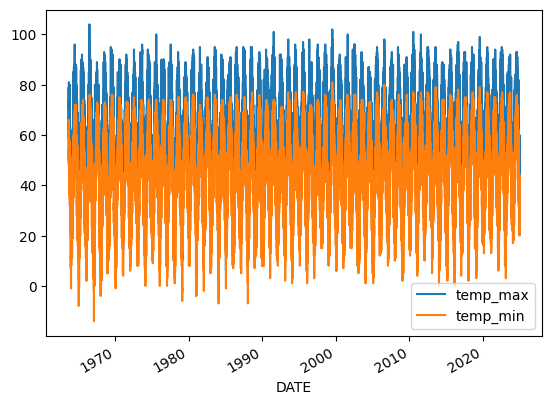

In [26]:
#Plot temperatures from dataset
core_val_weather[['temp_max', 'temp_min']].plot()

From this plot I can see, that I have complete data, that I can use in model

<Axes: xlabel='DATE'>

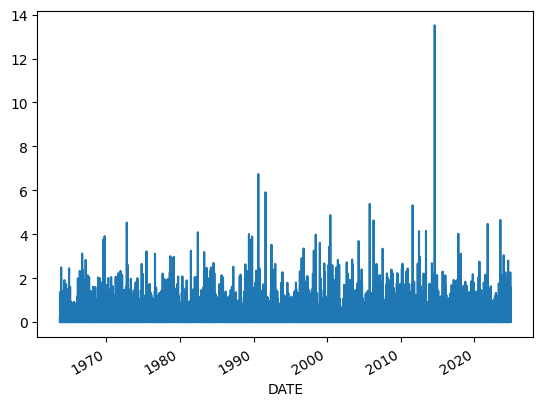

In [27]:
#Plot out he percip col
core_val_weather['percip'].plot()

<Axes: xlabel='DATE'>

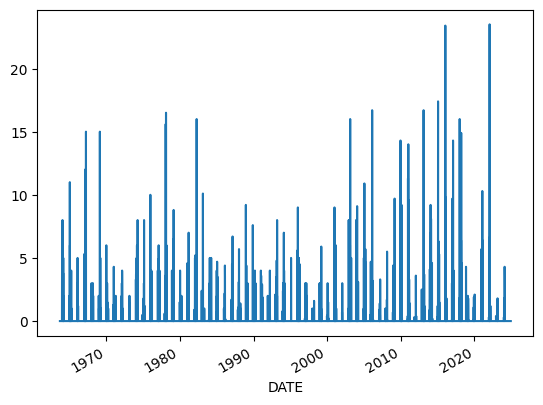

In [28]:
#Plot out he snow col
core_val_weather['snow'].plot()

<Axes: xlabel='DATE'>

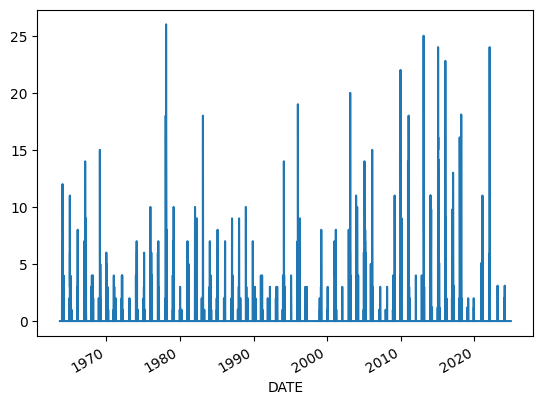

In [29]:
#Plot out he snow_dep col
core_val_weather['snow_dep'].plot()

On each plot I see that values from these columns are fine and complete

## ML model

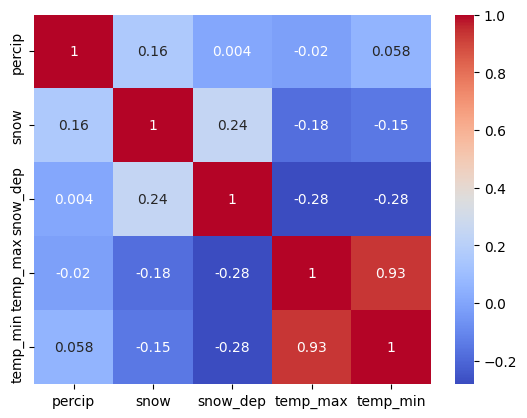

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(core_val_weather.corr(), annot=True, cmap='coolwarm')
plt.show()

I attempted to train my model multiple times using different combinations of values from the selected dataset. Ultimately, I decided to choose the variables with the highest correlation—maximum and minimum temperature

In [31]:
#Take values from the target column
target = 'temp_max'
values = core_val_weather[['temp_max', 'temp_min']].values

In [32]:
values

array([[64, 53],
       [59, 54],
       [73, 50],
       ...,
       [35, 20],
       [42, 20],
       [53, 37]])

In [33]:
#Normalization
data_scaler = MinMaxScaler()
values = data_scaler.fit_transform(values)

In [34]:
values

array([[0.59183673, 0.70526316],
       [0.54081633, 0.71578947],
       [0.68367347, 0.67368421],
       ...,
       [0.29591837, 0.35789474],
       [0.36734694, 0.35789474],
       [0.47959184, 0.53684211]])

In [35]:
# Use TimeSeriesGenerator to prepare the data for the LSTM model
# It automatically creates sliding windows of size `sequence_length`
# to generate input-output pairs for time series forecasting
sequence_length = 10
data_gen = TimeseriesGenerator(data=values, targets=values, length=sequence_length, batch_size=32)

In [36]:
#Split for train and test sets
train_size = int(len(data_gen) * 0.8)
data_train, data_test = train_test_split(data_gen, train_size=train_size, shuffle=False) #na True

In [37]:
data_train

[(array([[[0.59183673, 0.70526316],
          [0.54081633, 0.71578947],
          [0.68367347, 0.67368421],
          [0.7244898 , 0.69473684],
          [0.70408163, 0.69473684],
          [0.74489796, 0.70526316],
          [0.66326531, 0.69473684],
          [0.68367347, 0.84210526],
          [0.62244898, 0.66315789],
          [0.55102041, 0.65263158]],
  
         [[0.54081633, 0.71578947],
          [0.68367347, 0.67368421],
          [0.7244898 , 0.69473684],
          [0.70408163, 0.69473684],
          [0.74489796, 0.70526316],
          [0.66326531, 0.69473684],
          [0.68367347, 0.84210526],
          [0.62244898, 0.66315789],
          [0.55102041, 0.65263158],
          [0.58163265, 0.67368421]],
  
         [[0.68367347, 0.67368421],
          [0.7244898 , 0.69473684],
          [0.70408163, 0.69473684],
          [0.74489796, 0.70526316],
          [0.66326531, 0.69473684],
          [0.68367347, 0.84210526],
          [0.62244898, 0.66315789],
          [0.5510204

In [38]:
data_test

[(array([[[0.74489796, 0.86315789],
          [0.74489796, 0.86315789],
          [0.74489796, 0.87368421],
          [0.75510204, 0.89473684],
          [0.74489796, 0.85263158],
          [0.78571429, 0.85263158],
          [0.75510204, 0.82105263],
          [0.71428571, 0.82105263],
          [0.68367347, 0.75789474],
          [0.66326531, 0.68421053]],
  
         [[0.74489796, 0.86315789],
          [0.74489796, 0.87368421],
          [0.75510204, 0.89473684],
          [0.74489796, 0.85263158],
          [0.78571429, 0.85263158],
          [0.75510204, 0.82105263],
          [0.71428571, 0.82105263],
          [0.68367347, 0.75789474],
          [0.66326531, 0.68421053],
          [0.71428571, 0.70526316]],
  
         [[0.74489796, 0.87368421],
          [0.75510204, 0.89473684],
          [0.74489796, 0.85263158],
          [0.78571429, 0.85263158],
          [0.75510204, 0.82105263],
          [0.71428571, 0.82105263],
          [0.68367347, 0.75789474],
          [0.6632653

In [39]:
# Przygotowanie danych wejściowych i wyjściowych
x_train, y_train = data_train[0]
x_test, y_test = data_test[0]

In [40]:
print(f'Train X shape: {x_train.shape}')
print(f'Train Y shape: {y_train.shape}')
print(f'Test Y shape: {x_test.shape}')
print(f'Test Y shape: {y_test.shape}')

Train X shape: (32, 10, 2)
Train Y shape: (32, 2)
Test Y shape: (32, 10, 2)
Test Y shape: (32, 2)


In [41]:
#Create LSTM model
model = Sequential([
    Input(shape=(sequence_length, 2)),
    LSTM(128, activation='relu', return_sequences=True, dropout=0.2),
    LSTM(64, activation='relu', return_sequences=True, dropout=0.2),
    LSTM(32, activation='relu', dropout=0.2),
    Dense(1) #by default activation in Dense layer is linear
])

In [42]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 10, 128)        │        67,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 10, 64)         │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 128,929 (503.63 KB)

 Trainable params: 128,929 (503.63 KB)

 Non-trainable params: 0 (0.00 B)

In [43]:
#Compile the model
model.compile(optimizer='adam', loss='mse')

In [44]:
#Add early stopping callback to monitoring val_loss. The model will stop after best weight of vall_loss
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [45]:
#Train the model
train_model = model.fit(x_train, y_train, epochs=100, batch_size=64, validation_data=(x_test, y_test), callbacks=[early_stopping])

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step - loss: 0.4304 - val_loss: 0.4501
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step - loss: 0.4126 - val_loss: 0.4279
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - loss: 0.3896 - val_loss: 0.4062
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step - loss: 0.3722 - val_loss: 0.3824
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - loss: 0.3456 - val_loss: 0.3551
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step - loss: 0.3217 - val_loss: 0.3236
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - loss: 0.3018 - val_loss: 0.2886
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - loss: 0.2713 - val_loss: 0.2505
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step - loss: 0.2292 - val_loss: 0.2085
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step - loss: 0.1826 - val_loss: 0.1620
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step - loss: 0.1376 - val_loss: 0.1122
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step - loss: 0.10

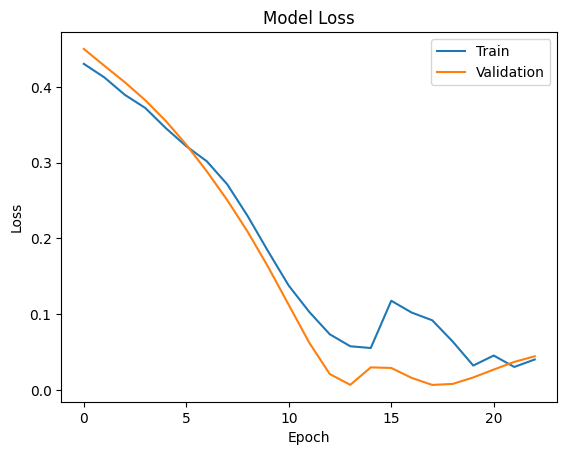

In [46]:
# Plot training & validation loss values
plt.plot(train_model.history['loss'])
plt.plot(train_model.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [47]:
#Predict
predicted = model.predict(x_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


In [48]:
y_test_temp_max = y_test[:, 0]

In [49]:
#Calculating errors
mae = mean_absolute_error(y_test_temp_max, predicted)
mse = mean_squared_error(y_test_temp_max, predicted)
rmse = np.sqrt(mse)

In [50]:
#Show results
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

Mean Absolute Error (MAE): 0.060304132499256924
Mean Squared Error (MSE): 0.0064897625561176845
Root Mean Squared Error (RMSE): 0.08055906253251514


In [51]:
# Rozszerzenie wymiaru predicted do (n_samples, 2)
predicted_expanded = np.zeros((predicted.shape[0], 2))
predicted_expanded[:, 0] = predicted[:, 0]  # Przewidywane wartości temp_max
predicted_expanded[:, 1] = y_test[:, 1]     # Rzeczywiste wartości temp_min
# Odwrotna transformacja danych
predicted_original = data_scaler.inverse_transform(predicted_expanded)
# Wyciągnięcie tylko kolumny temp_max po odwrotnej transformacji
predicted_original_temp_max = predicted_original[:, 0]

In [52]:
#Change labels to original scale
y_test_original = data_scaler.inverse_transform(y_test)

In [53]:
time_index = core_val_weather.index[-len(y_test):]

In [54]:
time_index

DatetimeIndex(['2024-11-15', '2024-11-16', '2024-11-17', '2024-11-18',
               '2024-11-19', '2024-11-20', '2024-11-21', '2024-11-22',
               '2024-11-23', '2024-11-24', '2024-11-25', '2024-11-26',
               '2024-11-27', '2024-11-28', '2024-11-29', '2024-11-30',
               '2024-12-01', '2024-12-02', '2024-12-03', '2024-12-04',
               '2024-12-05', '2024-12-06', '2024-12-07', '2024-12-08',
               '2024-12-09', '2024-12-10', '2024-12-11', '2024-12-12',
               '2024-12-13', '2024-12-14', '2024-12-15', '2024-12-16'],
              dtype='datetime64[ns]', name='DATE', freq=None)

In [55]:
y_test_original[:, 0]

array([76., 76., 77., 73., 73., 75., 75., 71., 69., 72., 72., 69., 68.,
       71., 74., 76., 72., 62., 68., 71., 72., 75., 72., 79., 77., 56.,
       57., 59., 72., 60., 60., 55.])

In [56]:
predicted_original_temp_max

array([83.26999283, 82.60041559, 81.70180857, 80.56917167, 79.07015371,
       77.84388733, 76.2750839 , 75.14977193, 74.25520122, 73.9877243 ,
       74.35038447, 74.14900136, 73.54510903, 72.6217351 , 72.15982032,
       72.14920092, 72.1841433 , 71.49786592, 71.66562676, 72.03034306,
       72.00830984, 72.22076213, 72.77557039, 73.68184114, 74.82269084,
       74.18903732, 73.59854484, 73.29138827, 73.65818405, 73.78392291,
       73.61351013, 72.46218705])

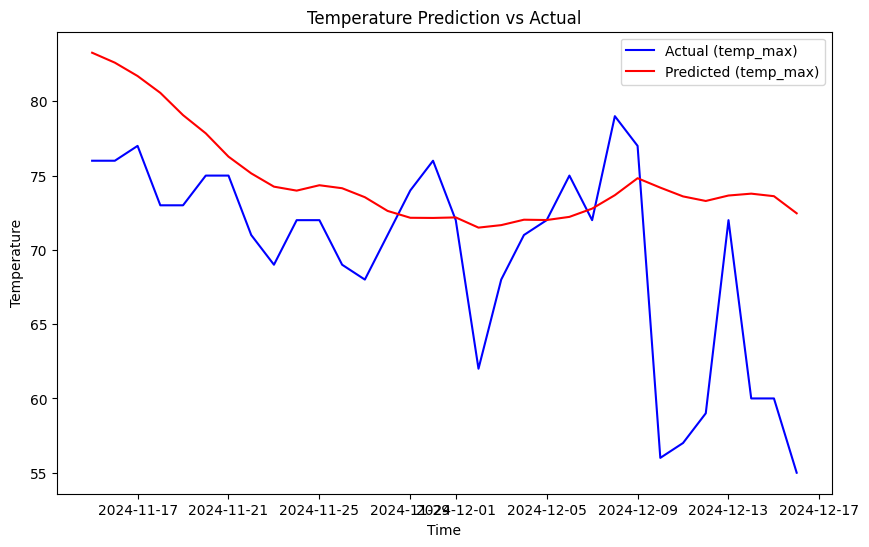

In [57]:
# Plotting predicted and actual temperatures
plt.figure(figsize=(10, 6))
plt.plot(time_index, y_test_original[:, 0], label='Actual (temp_max)', color='blue')  # Dla temp_max
plt.plot(time_index, predicted_original_temp_max, label='Predicted (temp_max)', color='red')  # Dla temp_max
plt.title('Temperature Prediction vs Actual')
plt.xlabel('Time')
plt.ylabel('Temperature')
plt.legend()
plt.show()

The model performs quite well in predicting temperature over a short period following the available historical data. However, its accuracy decreases as the prediction horizon extends, which is understandable—forecasting the weather for the next day is much easier than predicting it several weeks ahead.

To improve the results, I experimented with various approaches: adjusting input data selections, refining normalization, modifying model parameters, and tweaking settings of other functions, such as sequence_length and patience. While further optimization is possible, my primary goal was to understand the process of data analysis, preprocessing, and the model’s functionality. I believe this goal has been achieved, and the project can be considered a success.

In the next stages of my career, I will focus on developing the skills I have gained and working on more advanced prediction methods.